# Autores:

* Samuel Rodrigues dos Santos - 190037822
* Guilherme Dias Amorim       - 190108061


# Versão feita para funcionar no google colab

# 1- Preparação

## 1.1 - Baixando os arquivos necessários (incluindo checagem de já existencia)

In [6]:
import os

# Baixar código Base do Artigo
base_file_id = '1EqYCnoUuA27bnS1xa0LM21mkSYLuEwEI'
base_file_name = 'deep-blind-watermark-removal.zip'
base_unzip_dir = '.'

if not os.path.exists(base_file_name):
    !gdown $base_file_id -O $base_file_name
    !unzip -q $base_file_name -d $base_unzip_dir

# Modelo pre-treinado
model_file_id = '1Yx_G7OGXtx4FKWLuU3XxSYWNwk6H9CTQ'
model_file_name = '27kpng_model_best.pth.tar'
model_unzip_dir = '.'

if not os.path.exists(model_file_name):
    !gdown $model_file_id -O $model_file_name
    !unzip -q $model_file_name -d $model_unzip_dir

# Baixar imagens naturais
natural_file_id = '1dQM7V9w5Dobn7Q0lD5MkCZ3d6G1Lf3Dg'
natural_file_name = 'natural.zip'
natural_unzip_dir = '.'

if not os.path.exists(natural_file_name):
    !gdown $natural_file_id -O $natural_file_name
    !unzip -q $natural_file_name -d $natural_unzip_dir

# Baixar meus logos
logos_file_id = '1Bg6ER35Imh4aGLhJ8IVZwyx2vmHP6WPT'
logos_file_name = 'my_logos.zip'
logos_unzip_dir = '.'

if not os.path.exists(logos_file_name):
    !gdown $logos_file_id -O $logos_file_name
    !unzip -q $logos_file_name -d $logos_unzip_dir

# Baixar e descompactar o arquivo TEST_IMG.zip
test_img_file_id = '1ZtKxk9-M4zSi__ySjf41yVQPpyR3riIH'
test_img_file_name = 'TEST_IMG.zip'
test_img_unzip_dir = '.'

if not os.path.exists(test_img_file_name):
    !gdown $test_img_file_id -O $test_img_file_name
    !unzip -q $test_img_file_name -d $test_img_unzip_dir

# Renomear imagens naturais(o construtor do database espera esse formato .jpg)
from os import listdir
from os.path import isfile, join
import shutil

natural_path = './natural'
filenames = [shutil.copy(join(natural_path, f), join(natural_path, f).split('-')[0]+'.jpg') for f in listdir(natural_path) if isfile(join(natural_path, f))]

## 1.2 - Bibliotecas necessárias

In [2]:
!pip install -r "/content/deep-blind-watermark-removal/requirements.txt" #Lista do artigo

#------------------------Bibliotecas listadas no artigo
'''
numpy==1.19.1
opencv-python==3.4.8.29
Pillow
scikit-image==0.14.5
scikit-learn==0.23.1
scipy==1.2.1
sklearn==0.0
tensorboardX
torch>=1.0.0
torchvision
'''
#------------------------Bibliotecas não listadas no artigo, mas nescessarias
!pip install progress==1.5
!pip install tensorboardX
!pip install pytorch_ssim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 14.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (pyproject.toml) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Preparing metadata (setup.py) ... done
  Created wheel for progress: filename=progress-1.5-py3-none-any.whl size=8069 sha256=2d445d12bbe17413897409deaf8edc2b44ad82ca9e49d167bc2277cfe06e2919
  Stored in directory: /root/.cache/pip/wheels/de/3a/3e/1d7b1427efb318d539fdbed8888a4d534746cb5548360b6a34
Successfully built progress
    

## 1.3 - Definindo caminho dos diretorios a serem usada

In [8]:
#----------------Diretorios das imagens e logos

#Database
databa_dir = "dataset"

#Diretorio para teste individuais
imagens_dir_tes = 'TEST_IMG/Imagens'
logo_dir_test = 'TEST_IMG/logo'

#Diretorios para criar data base
my_dataset_dir = 'natural'
logo_dir       = 'my_logos'

# 2 - Gerando minhas imagens com marca d' agua

## 2.1 - Sintese modificada para adicionar os meus logos as minhas imagens

In [14]:
#Sintese watermark
import os
import random
import shutil
from PIL import Image
import numpy as np

def trans_paste(bg_img,fg_img,mask,box=(0,0)):
    fg_img_trans = Image.new("RGBA",bg_img.size)
    fg_img_trans.paste(fg_img,box,mask=mask)
    new_img = Image.alpha_composite(bg_img,fg_img_trans)
    return new_img,fg_img_trans

# ...

if os.path.isdir('dataset'):
    shutil.rmtree('dataset')

os.mkdir('dataset')
BASE_IMG_DIR = imagens_dir_tes
WATERMARK_DIR = logo_dir_test

images = sorted([os.path.join(BASE_IMG_DIR, x) for x in os.listdir(BASE_IMG_DIR) if '.png' in x])
watermarks = sorted([os.path.join(WATERMARK_DIR, x).replace(' ', '_') for x in os.listdir(WATERMARK_DIR) if '.png' in x])
# Rename all the watermark from replace ' ' to '_'

random.shuffle(images)
random.shuffle(watermarks)

# Use all images and watermarks for the test set
test_images = images
test_wms = watermarks

# Save all the settings to file
names = ['test_images', 'test_wms']
lists = [test_images, test_wms]
dataset = dict(zip(names, lists))

for name, content in dataset.items():
    with open('dataset/%s.txt' % name, 'w') as f:
        f.write("\n".join(content))

print('SAVE ALL THE SETTING')

for name, images in dataset.items():
    if 'images' not in name:
        continue
    # For each setting, synthesize the watermark
    # For each image, add X (X=6) watermark in different positions, alpha,
    # save the synthesized image, watermark mask, reshaped mask,
    save_path = 'dataset/%s/' % name
    os.makedirs('%s/image' % (save_path))
    os.makedirs('%s/mask' % (save_path))
    os.makedirs('%s/wm' % (save_path))

    for img in images:
        im = Image.open(img).convert('RGBA')
        imw, imh = im.size

        for wmg in random.choices(dataset[name.replace('images', 'wms')], k=6):
            wm = Image.open(wmg).convert("RGBA")

            # Get the mask of wm
            # Data augmentation of wm
            wm = wm.rotate(angle=random.randint(0, 360), expand=True)  # Rotate

            # Make sure the
            imrw = random.randrange(int(0.4 * imw), int(0.8 * imw))
            imrh = random.randrange(int(0.4 * imh), int(0.8 * imh))
            wmsize = imrh if imrw > imrh else imrw
            wm = wm.resize((wmsize, wmsize), Image.BILINEAR)
            w, h = wm.size  # New size

            box_left = random.randint(0, imw - w)
            box_upper = random.randint(0, imh - h)
            wmm = wm.copy()
            wm.putalpha(random.randint(int(255 * 0.4), int(255 * 0.8)))  # Alpha

            ims, wmc = trans_paste(im, wm, wmm, (box_left, box_upper))

            wmnp = np.array(wmc)  # h,w,3
            mask = np.sum(wmnp, axis=2) > 0
            mm = Image.fromarray(np.uint8(mask * 255), mode='L')

            identifier = os.path.basename(img).split('.')[0] + '-' + os.path.basename(wmg).split('.')[0] + '.png'
            # Save
            wmc.save('%s/wm/%s' % (save_path, identifier))
            ims.save('%s/image/%s' % (save_path, identifier))
            mm.save('%s/mask/%s' % (save_path, identifier))


SAVE ALL THE SETTING


## 2.2 - Salvando as imagens originas no diretorio, que serão usadas como alvos pretendidos

In [16]:
import os
import shutil

# Obtém a lista de nomes de todas as imagens no diretório imagens_dir
name_img = [img for img in os.listdir(imagens_dir_tes) if img.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

# Corrigindo um erro na criação de diretório e esperado a imagem original
for i, img in enumerate(name_img):
    # Caminho do arquivo a ser copiado
    arquivo_origem = os.path.join(imagens_dir_tes, img)

    # Criar um diretório de destino se não existir
    diretorio_destino = os.path.join(databa_dir, 'natural')
    if not os.path.exists(diretorio_destino):
        os.makedirs(diretorio_destino)

    # Construir o caminho completo para o arquivo de destino com extensão .jpg
    arquivo_destino = os.path.join(diretorio_destino, f"{img.split('.')[0]}.jpg")

    # Copiar o arquivo
    shutil.copy(arquivo_origem, arquivo_destino)

print(f'{i+1} imagens foram copiadas para natural com extensão .jpg')


4 imagens foram copiadas para natural com extensão .jpg


# 3-Criando data base

## 3.1 - Adicionando marca d' agua nas imagens escolhidas para compor meu banco de dados

4051 imagens , 256x256 , RGB , .png


4 - Logos

In [9]:
porcent_img = 0.2                   #Porcentagem das imagem que quero usar do datset

# watermark synthesis
import os
import random
import shutil
from PIL import Image
import numpy as np

def trans_paste(bg_img,fg_img,mask,box=(0,0)):
    fg_img_trans = Image.new("RGBA",bg_img.size)
    fg_img_trans.paste(fg_img,box,mask=mask)
    new_img = Image.alpha_composite(bg_img,fg_img_trans)
    return new_img,fg_img_trans

if os.path.isdir('dataset'):
    shutil.rmtree('dataset')

os.mkdir('dataset')
BASE_IMG_DIR = my_dataset_dir
WATERMARK_DIR = logo_dir

images = sorted([os.path.join(BASE_IMG_DIR, x) for x in os.listdir(BASE_IMG_DIR) if '.png' in x])

percentage_of_images = porcent_img
selected_images = random.sample(images, int(len(images) * percentage_of_images))

images = sorted(selected_images) # Substituindo a lista original pelas imagens selecionadas aleatoriamente


watermarks = sorted([os.path.join(WATERMARK_DIR,x).replace(' ','_') for x in os.listdir(WATERMARK_DIR) if '.png' in x])
# rename all the watermark from replace ' ' to '_'

random.shuffle(images)
random.shuffle(watermarks)

train_images = images[:int(len(images)*0.7)]
val_images = images[int(len(images)*0.7):int(len(images)*0.8)]
test_images = images[int(len(images)*0.8):]

train_wms = watermarks[:int(len(watermarks)*0.7)]
val_wms = watermarks[int(len(watermarks)*0.7):int(len(watermarks)*0.8)]
test_wms = watermarks[int(len(watermarks)*0.8):]

# save all the settings to file
names = ['train_images','val_images','test_images','train_wms','val_wms','test_wms']
lists = [train_images,val_images,test_images,train_wms,val_wms,test_wms]
dataset = dict(zip(names, lists))

for name,content in dataset.items():
    with open('dataset/%s.txt'%name,'w') as f:
        f.write("\n".join(content))

print('SAVE ALL THE SETTING')

for name, images in dataset.items():
    if 'images' not in name:
        continue
    # for each setting, synthesis the watermark
    # for each image, add X(X=6) watermark in differnet position, alpha,
    # save the synthesized image, watermark mask, reshaped mask,
    save_path = 'dataset/%s/'%name
    os.makedirs('%s/image'%(save_path))
    os.makedirs('%s/mask'%(save_path))
    os.makedirs('%s/wm'%(save_path))

    for i,img in enumerate(images):
        im = Image.open(img).convert('RGBA')
        imw,imh = im.size

        for wmg in random.choices(dataset[name.replace('images','wms')],k=6):
            wm = Image.open(wmg).convert("RGBA")

            # get the mask of wm
            # data agumentation of wm
            wm = wm.rotate(angle=random.randint(0,360),expand=True) # rotate

            # make sure the
            imrw = random.randrange(int(0.4*imw),int(0.8*imw))
            imrh = random.randrange(int(0.4*imh),int(0.8*imh))
            wmsize = imrh if imrw > imrh else imrw
            wm = wm.resize((wmsize,wmsize),Image.BILINEAR)
            w,h = wm.size # new size

            box_left = random.randint(0,imw-w)
            box_upper = random.randint(0,imh-h)
            wmm = wm.copy()
            wm.putalpha(random.randint(int(255*0.4),int(255*0.8))) # alpha

            ims,wmc = trans_paste(im,wm,wmm,(box_left,box_upper))

            wmnp = np.array(wmc) # h,w,3
            mask = np.sum(wmnp,axis=2)>0
            mm = Image.fromarray(np.uint8(mask*255),mode='L')

            identifier = os.path.basename(img).split('.')[0] +'-'+os.path.basename(wmg).split('.')[0] + '.png'
            # save
            wmc.save('%s/wm/%s'%(save_path,identifier))
            ims.save('%s/image/%s'%(save_path,identifier))
            mm.save('%s/mask/%s'%(save_path,identifier))

print(f'Dataset Criado com {i+1} imagens')

SAVE ALL THE SETTING
Dataset Criado com 162 imagens


## 3.2 - Salvando as imagens originas no diretorio, que serão usadas como alvos pretendidos

In [11]:
import os
import shutil

# Obtém a lista de nomes de todas as imagens no diretório imagens_dir
name_img = [img for img in os.listdir(my_dataset_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

# Corrigindo um erro na criação de diretório e esperado a imagem original
for i, img in enumerate(name_img):
    # Caminho do arquivo a ser copiado
    arquivo_origem = os.path.join(my_dataset_dir, img)

    # Criar um diretório de destino se não existir
    diretorio_destino = os.path.join(databa_dir, 'natural')
    if not os.path.exists(diretorio_destino):
        os.makedirs(diretorio_destino)

    # Construir o caminho completo para o arquivo de destino com extensão .jpg
    arquivo_destino = os.path.join(diretorio_destino, f"{img.split('.')[0]}.jpg")

    # Copiar o arquivo
    shutil.copy(arquivo_origem, arquivo_destino)

print(f'{i+1} imagens foram copiadas para natural com extensão .jpg')


8102 imagens foram copiadas para natural com extensão .jpg


# 4 -Treinamento (necessario CUDA)

## 4.1 - Modificando partes do treinamento original , para se adaptar ao minha base de dados

In [ ]:
# Algumas funções estão desatualizadas, substituindo
def modificar_codigo(arquivo, trecho_antigo, trecho_novo):
    with open(arquivo, 'r') as file:
        codigo = file.read()

    # Fazendo as modificações desejadas no código
    novo_codigo = codigo.replace(trecho_antigo, trecho_novo)

    with open(arquivo, 'w') as file:
        file.write(novo_codigo)

# Substituindo compare_psnr e compare_ssim em BasicMachine, VX.py , S2AM.py
arquivo_vx = "/content/deep-blind-watermark-removal/scripts/machines/VX.py"
arquivo_s2am = "/content/deep-blind-watermark-removal/scripts/machines/S2AM.py"
arquivo_basic = "/content/deep-blind-watermark-removal/scripts/machines/BasicMachine.py"

#Mexendo no Treinamento ga
arquivo_main = "/content/deep-blind-watermark-removal/main.py"

trecho_antigo = 'from skimage.measure import compare_psnr,compare_ssim'
trecho_novo = 'from skimage.metrics import structural_similarity as compare_ssim\nfrom skimage.metrics import peak_signal_noise_ratio as compare_psnr\n'

# Realizando a modificação em VX.py
modificar_codigo(arquivo_vx, trecho_antigo, trecho_novo)

# Realizando a modificação em S2AM.py
modificar_codigo(arquivo_s2am, trecho_antigo, trecho_novo)

# Realizando a modificação em BasicMachine.py
modificar_codigo(arquivo_basic, trecho_antigo, trecho_novo)

#--------------------------------Substituindo a condição no trecho de treinamento em main.py

trecho_antigo = ''' if 'HFlickr' or 'HCOCO' or 'Hday2night' or 'HAdobe5k' in args.base_dir:
        dataset_func = datasets.BIH
    else:
        dataset_func = datasets.COCO'''
trecho_novo = ' dataset_func = datasets.COCO'
# Realizando a modificação
modificar_codigo(arquivo_main, trecho_antigo, trecho_novo)


In [ ]:
import os
import fnmatch
import fileinput

def replace_cuda_with_cpu(directory):
    for file in fnmatch.filter(os.listdir(directory), '*.py'):
        file_path = os.path.join(directory, file)
        with fileinput.FileInput(file_path, inplace=True) as f:
            for line in f:
                # Substituir todas as instâncias de .cuda() por .cpu()
                line = line.replace('.cuda()', '.cpu()')
                print(line, end='')

# Substitua 'seu_diretorio' pelo caminho do diretório que contém seus arquivos .py
replace_cuda_with_cpu('/content/deep-blind-watermark-removal')


## 4.2 - Executando o bash de treinamento

In [ ]:
import os
import sys

# Modificando o bash para meu treinamento
script_content = f"""
set -ex

# Defina CUDA_VISIBLE_DEVICES para evitar o uso da GPU
export CUDA_VISIBLE_DEVICES=''

# Exemplo de treinamento
python /content/deep-blind-watermark-removal/main.py --epochs 100 \\
 --schedule 100 \\
 --lr 1e-3 \\
 -c eval/10kgray/1e3_bs4_256_hybrid_ssim_vgg \\
 --arch vvv4n \\
 --sltype vggx \\
 --style-loss 0.025 \\
 --ssim-loss 0.15 \\
 --masked True \\
 --loss-type hybrid \\
 --limited-dataset 1 \\
 --machine vx \\
 --input-size 256 \\
 --train-batch 4 \\
 --test-batch 1 \\
 --base-dir /content/dataset \\
 --data _images
"""

# Salvar o script bash modificado
with open('/content/modified_evaluation.sh', 'w') as script_file:
    script_file.write(script_content)

# Dar permissão de execução ao script
!chmod +x /content/modified_evaluation.sh

# Executar o script bash
!bash /content/modified_evaluation.sh


+ export CUDA_VISIBLE_DEVICES=
+ CUDA_VISIBLE_DEVICES=
+ python /content/deep-blind-watermark-removal/main.py --epochs 100 --schedule 100 --lr 1e-3 -c eval/10kgray/1e3_bs4_256_hybrid_ssim_vgg --arch vvv4n --sltype vggx --style-loss 0.025 --ssim-loss 0.15 --masked True --loss-type hybrid --limited-dataset 1 --machine vx --input-size 256 --train-batch 4 --test-batch 1 --base-dir /content/dataset --data _images
==================================== WaterMark Removal =============================================
==> Start Time                                        : Sat Dec 16 04:20:36 2023
==> USE GPU                                           : 
==================================== Stable Parameters =============================================
==> darch                                             : dhn(dhn)
==> workers                                           : 2(2)
==> start_epoch                                       : 0(0)
==> lr                                                : 0.001

# 5 - Usando o Modelo pré_treinado em meus dados de teste

OBS: É necessário executar a seção 2 (2.1 e 2.2) antes de executar esta seção, e não ter executado a seção 3 anteriormente; caso contrário, isso causará problemas(muitos argumentos).

total Dataset of test_images is :  12
input          | target              | coarser            | final
----------------------------------------------------------------------------
predicted mask | predicted watermark | coarser difference | final difference


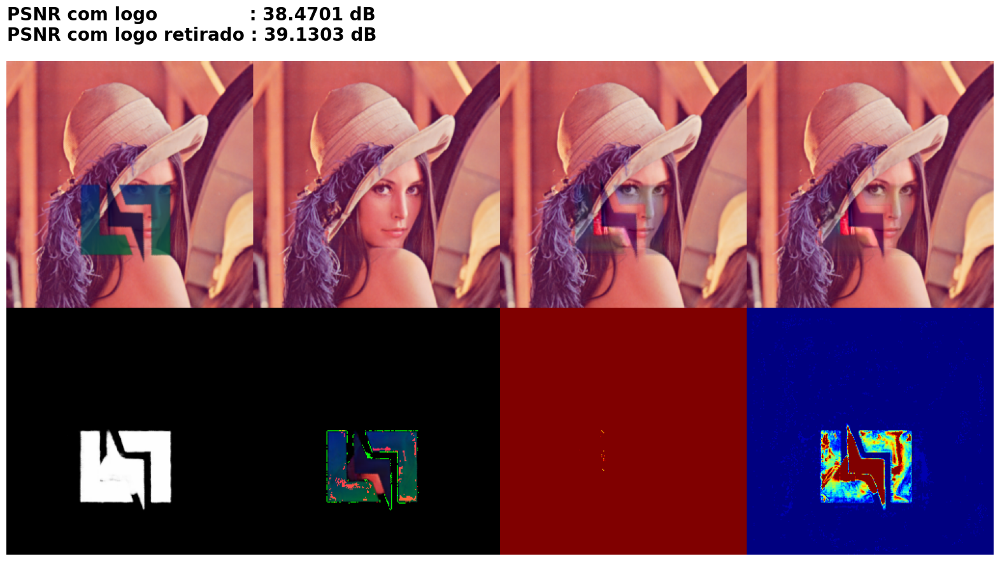

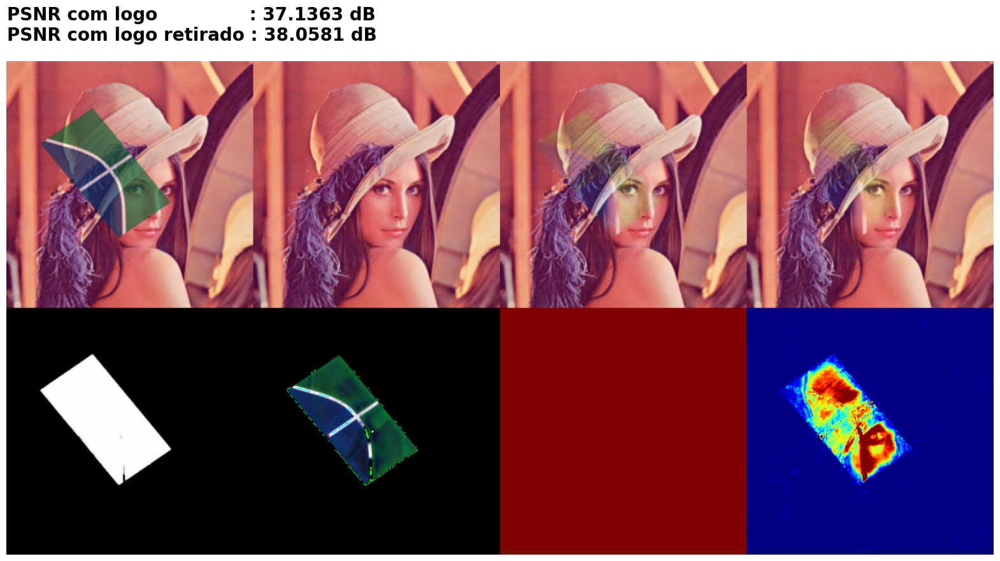

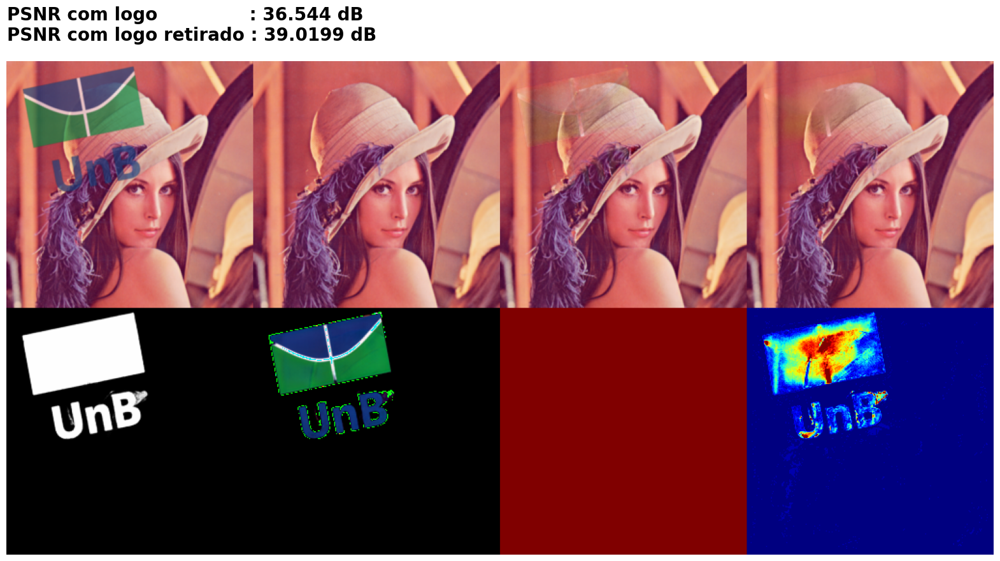

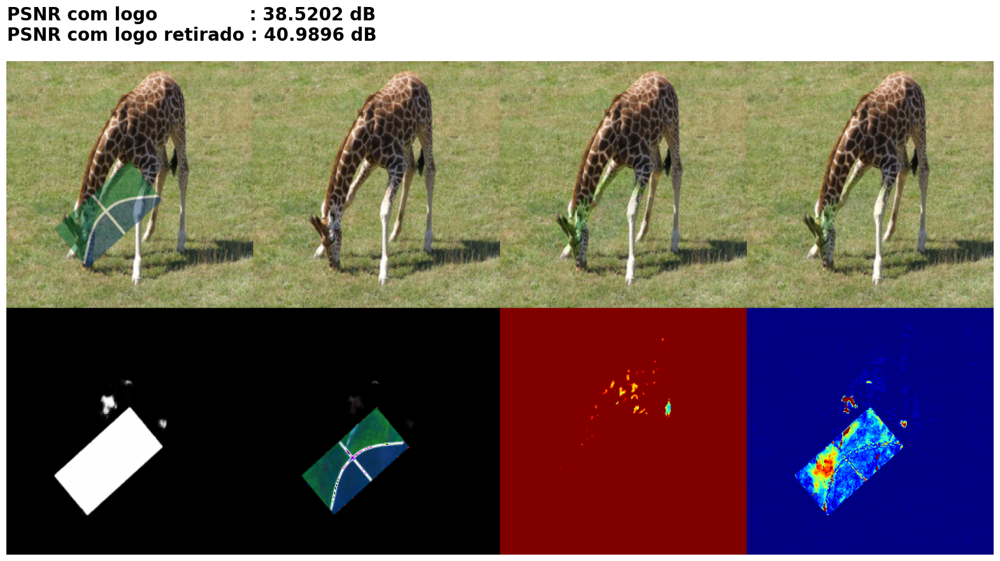

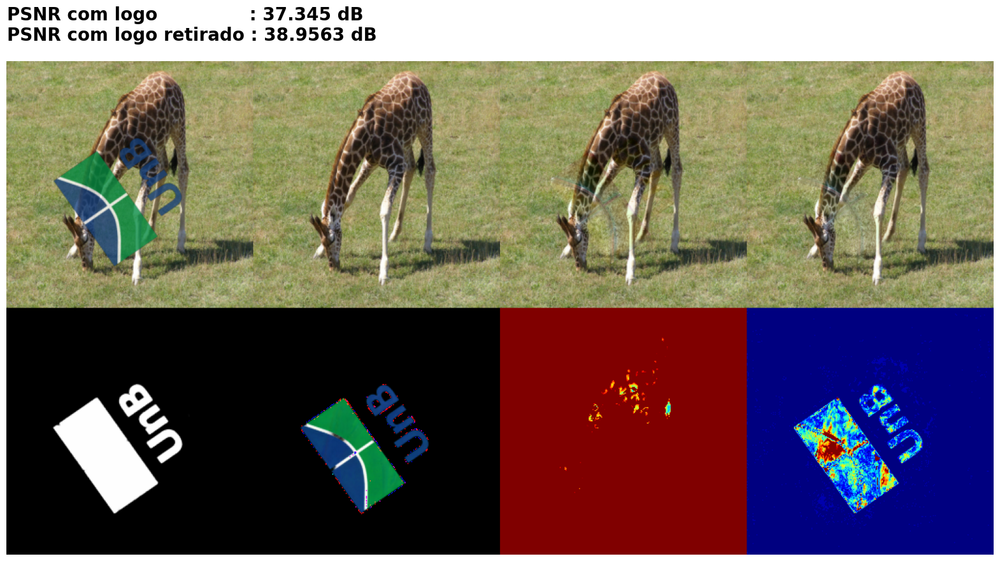

...

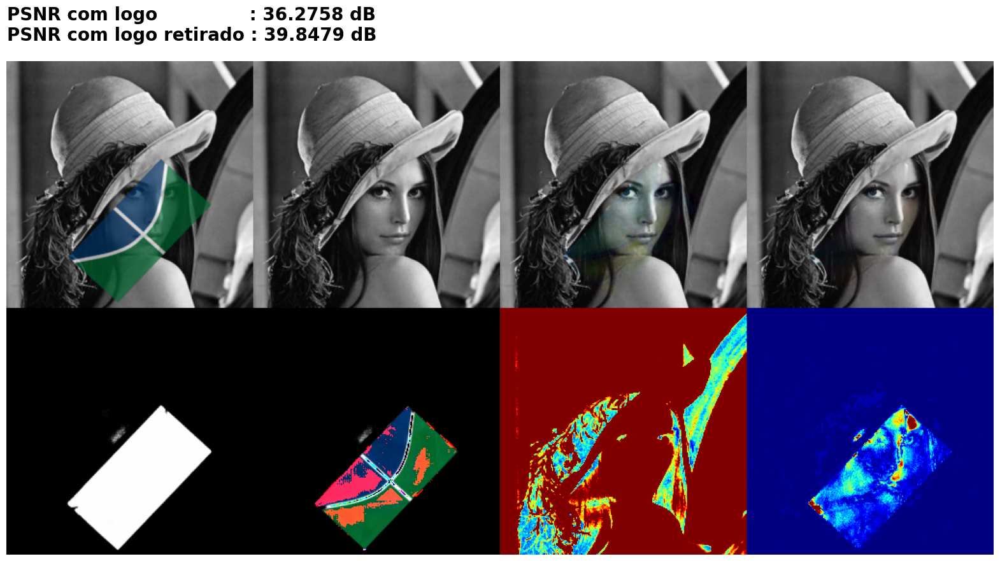

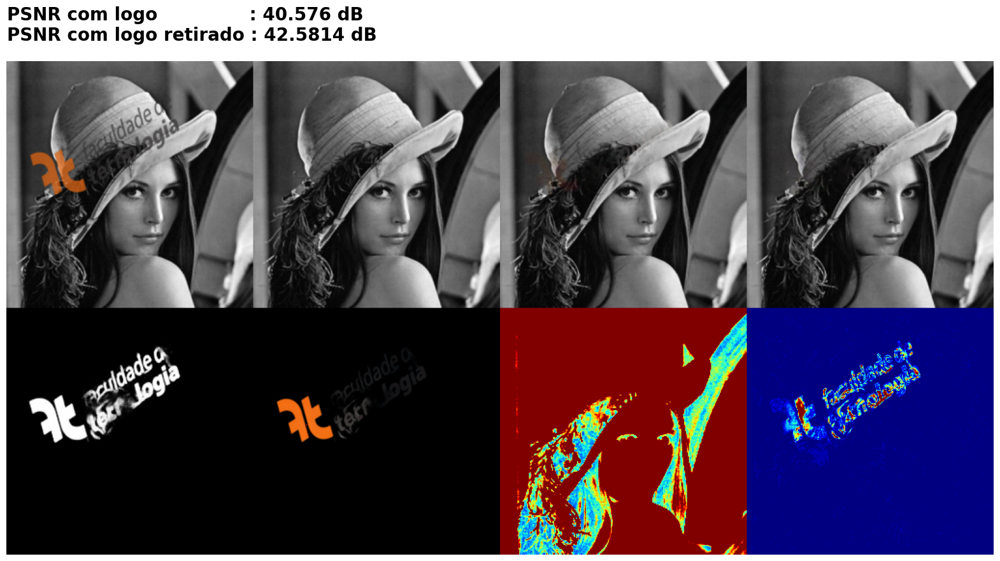

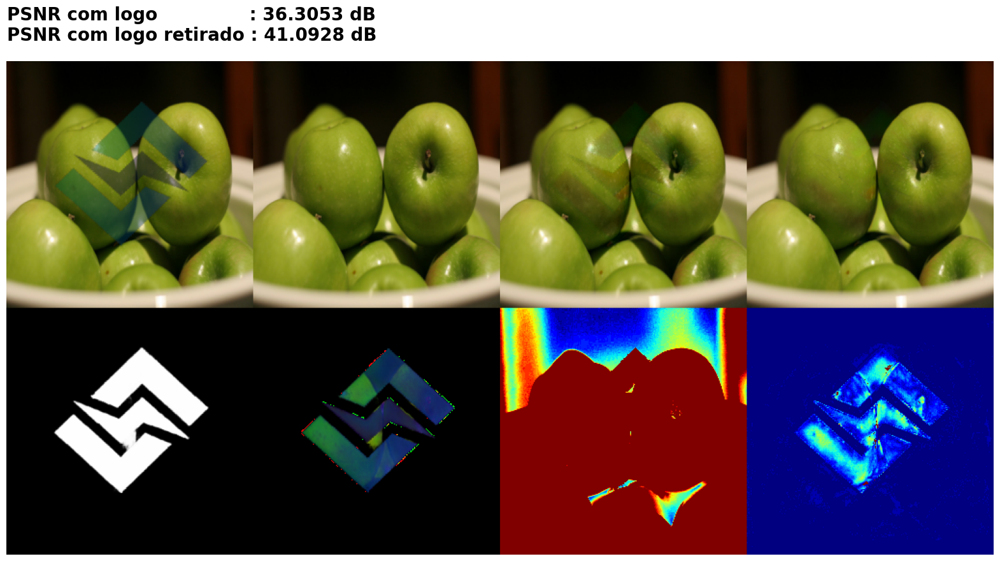

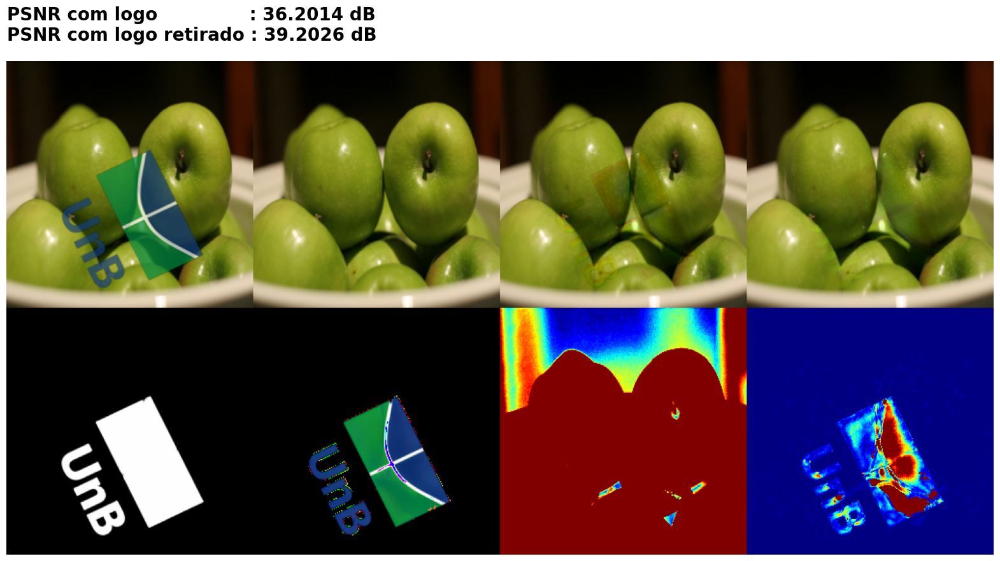

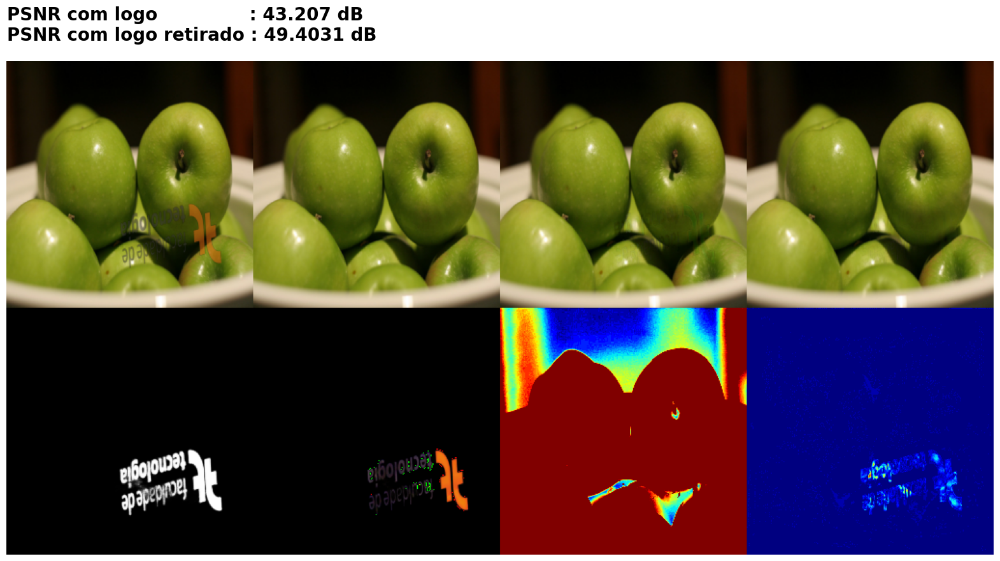

In [17]:
import os, sys, torch,random
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
import cv2

sys.path.append('deep-blind-watermark-removal')
sys.path.insert(0,'deep-blind-watermark-removal')

from scripts.utils.imutils import im_to_numpy
import scripts.models as models
import scripts.datasets as datasets
%matplotlib inline
from PIL import Image, ImageChops


# Calcular o PSNR
def psnr(original,removed):

    # Verificar se as imagens têm o mesmo tamanho
    if original.shape == removed.shape:
        # Calcular o MSE (Mean Squared Error)
        mse = np.mean((original - removed) ** 2)

        # Calcular o PSNR
        if mse == 0:
            return float('inf')  # PSNR é infinito se o MSE for zero
        max_pixel_value = 255.0
        psnr_value = 20 * np.log10(max_pixel_value / np.sqrt(mse))
        return psnr_value
    else:
        raise ValueError("As imagens não têm o mesmo tamanho.")

def get_jet():
    colormap_int = np.zeros((256, 3), np.uint8)

    for i in range(0, 256, 1):
        colormap_int[i, 0] = np.int_(np.round(cm.jet(i)[0] * 255.0))
        colormap_int[i, 1] = np.int_(np.round(cm.jet(i)[1] * 255.0))
        colormap_int[i, 2] = np.int_(np.round(cm.jet(i)[2] * 255.0))

    return colormap_int

def clamp(num, min_value, max_value):
    return max(min(num, max_value), min_value)

def gray2color(gray_array, color_map):

    rows, cols = gray_array.shape
    color_array = np.zeros((rows, cols, 3), np.uint8)

    for i in range(0, rows):
        for j in range(0, cols):
#             log(256,2) = 8 , log(1,2) = 0 * 8
            color_array[i, j] = color_map[clamp(int(abs(gray_array[i, j])*10),0,255)]

    return color_array

class objectview(object):
    def __init__(self, *args, **kwargs):
        d = dict(*args, **kwargs)
        self.__dict__ = d

jet_map = get_jet()

resume_path = '27kpng_model_best.pth.tar' # path of pretrained model
samples = [2] #random.sample(range(4000), 1) # show random sample
samples_t = []

data_config  = objectview({'input_size':256,
                            'limited_dataset':0,
                            'normalized_input':False,
                            'data_augumentation':False,
                            'base_dir': databa_dir,
                            'data':'_images'})

#val_loader = torch.utils.data.DataLoader(datasets.COCO('val',config=data_config,sample=samples))
test_loader = torch.utils.data.DataLoader(datasets.COCO('test',config=data_config,sample=samples_t))

print('input          | target              | coarser            | final')
print('----------------------------------------------------------------------------')
print('predicted mask | predicted watermark | coarser difference | final difference')

with torch.no_grad():
        model = models.__dict__['vvv4n']()

        # Verifica se o CUDA está disponível
        if torch.cuda.is_available():
            # Move o modelo para a GPU
            model = model.to('cuda')

            # Carrega o modelo na GPU
            checkpoint = torch.load(resume_path)
        else:
            # Carrega o modelo na CPU
            checkpoint = torch.load(resume_path, map_location=torch.device('cpu'))

        model.load_state_dict(checkpoint['state_dict'])
        model.eval()


        #To usando so um termo do iterador
        #batches  = next(iter(val_loader))
        #batches  = next(iter(test_loader))
        for i, batches in enumerate(test_loader):

            im,mask,target = batches['image'],batches['mask'],batches['target']

            # Verificar o shape do tensor

            imoutput,immask,imwatermark = model(im)

            imcoarser,imrefine,imwatermark = imoutput[1]*immask + im*(1-immask),imoutput[0]*immask + im*(1-immask),imwatermark*immask

            ims1 = im_to_numpy(torch.clamp(torch.cat([im,target,imcoarser,imrefine],dim=3)[0]*255,min=0.0,max=255.0)).astype(np.uint8)

            im = im_to_numpy((im[0]*255)).astype(np.uint8)

            imcoarser, imrefine, target  = im_to_numpy((imcoarser[0]*255)).astype(np.uint8), im_to_numpy((imrefine[0]*255)).astype(np.uint8), im_to_numpy((target[0]*255)).astype(np.uint8)

            immask, imwatermark = im_to_numpy((immask.repeat(1,3,1,1)[0]*255)).astype(np.uint8),im_to_numpy((imwatermark[0]*255)).astype(np.uint8)

            coarsenp = gray2color(np.array((Image.fromarray(imcoarser)).convert('L')),jet_map)
            finenp = gray2color(np.array(ImageChops.difference(Image.fromarray(imrefine),Image.fromarray(target)).convert('L')),jet_map)

            imfinal = np.concatenate([ims1,np.concatenate([immask,imwatermark,coarsenp,finenp],axis=1)],axis=0)

            plt.figure(figsize = (20,20))
            plt.axis('off')

            #plt.imshow(ims1)
            #Plotando
            plt.imshow(imfinal,vmin=0.0,vmax=255.0)                                           #Imagens com mascaras
            plt.text(0,0,f'PSNR com logo               : {round(psnr(target,im),4)} dB \nPSNR com logo retirado : {round(psnr(target,imrefine),4)} dB\n',fontweight="bold", fontsize=20)  # PSNR pra cada uma
